# About the notebook

In [33]:
### import libraries
suppressMessages(suppressWarnings(library(tidyverse)))
suppressMessages(suppressWarnings(library(MPSK)))
suppressMessages(suppressWarnings(library(tsne)))

suppressMessages(suppressWarnings(library(flowCore)))
suppressMessages(suppressWarnings(library(flowStats)))
suppressMessages(suppressWarnings(library(flowViz)))
suppressMessages(suppressWarnings(library(flowMatch)))
suppressMessages(suppressWarnings(library(flowMap)))

suppressMessages(suppressWarnings(library(igraph)))
suppressMessages(suppressWarnings(library(pheatmap)))
suppressMessages(suppressWarnings(library(RColorBrewer)))
suppressMessages(suppressWarnings(library(gplots)))
suppressMessages(suppressWarnings(library(GGally)))
suppressMessages(suppressWarnings(library(gridExtra)))

### set directories
dat_dir = "/data/clintko/SMPK"

# Import data

In [6]:
dat_mpsk_raw  = read_delim(file.path(dat_dir, "ep8cs_prior50_dat_mpsk_raw.txt"),  delim = "\t")
dat_mpsk_cal  = read_delim(file.path(dat_dir, "ep8cs_prior50_dat_mpsk_cal.txt"),  delim = "\t")
dat_gaussnorm = read_delim(file.path(dat_dir, "ep8cs_prior50_dat_gaussnorm.txt"), delim = "\t")

Parsed with column specification:
cols(
  sample = col_character(),
  cluster = col_integer(),
  `FSC-A` = col_double(),
  `SSC-A` = col_double(),
  Aqua = col_double(),
  CD3 = col_double(),
  CD4 = col_double(),
  CD8 = col_double(),
  TNFa = col_double(),
  IL2 = col_double(),
  IFNg = col_double(),
  CD107a = col_double()
)
Parsed with column specification:
cols(
  sample = col_character(),
  cluster = col_integer(),
  `FSC-A` = col_double(),
  `SSC-A` = col_double(),
  Aqua = col_double(),
  CD3 = col_double(),
  CD4 = col_double(),
  CD8 = col_double(),
  TNFa = col_double(),
  IL2 = col_double(),
  IFNg = col_double(),
  CD107a = col_double()
)
Parsed with column specification:
cols(
  sample = col_character(),
  `FSC-A` = col_double(),
  `SSC-A` = col_double(),
  Aqua = col_double(),
  CD3 = col_double(),
  CD4 = col_double(),
  CD8 = col_double(),
  TNFa = col_double(),
  IL2 = col_double(),
  IFNg = col_double(),
  CD107a = col_double()
)


Import tsne coordinates

In [4]:
tmp = file.path(dat_dir, "ep8cs_prior50*")
system(paste("ls -1", tmp), intern = TRUE)

[1] "/data/clintko/SMPK/ep8cs_prior50_dat_gaussnorm.txt" 
[2] "/data/clintko/SMPK/ep8cs_prior50_dat_mpsk_cal.txt"  
[3] "/data/clintko/SMPK/ep8cs_prior50_dat_mpsk_raw.txt"  
[4] "/data/clintko/SMPK/ep8cs_prior50_tsne_gaussnorm.txt"
[5] "/data/clintko/SMPK/ep8cs_prior50_tsne_mpsk_cal.txt" 
[6] "/data/clintko/SMPK/ep8cs_prior50_tsne_raw.txt"

In [5]:
tsne_mpsk_raw  = read_delim(file.path(dat_dir, "ep8cs_prior50_tsne_raw.txt"),       delim = "\t", col_names = FALSE)
tsne_mpsk_cal  = read_delim(file.path(dat_dir, "ep8cs_prior50_tsne_mpsk_cal.txt"),  delim = "\t", col_names = FALSE)
tsne_gaussnorm = read_delim(file.path(dat_dir, "ep8cs_prior50_tsne_gaussnorm.txt"), delim = "\t", col_names = FALSE)

Parsed with column specification:
cols(
  X1 = col_double(),
  X2 = col_double()
)
Parsed with column specification:
cols(
  X1 = col_double(),
  X2 = col_double()
)
Parsed with column specification:
cols(
  X1 = col_double(),
  X2 = col_double()
)


observe the label

In [7]:
### initialization
idxs = str_pad(1:18, 2, pad = "0")
dat  = dat_mpsk_raw

### take a look at the labels of each sample
lapply(idxs, function(idx) {
    ### sample of each data
    dat_sub = dat %>% dplyr::filter(sample == idx)
    
    ### extract the cluster of each subsample
    clust   = dat_sub$cluster %>% sort %>% unique
    
    return(clust)
}) # end lapply

[[1]]
 [1]  3  4  7  8 17 18 19 20 21 22 23 25 26 31 33 34 37 45 46 47

[[2]]
 [1]  7  8 10 15 17 19 20 21 22 23 26 31 32 33 34 36 37 45 46 47

[[3]]
 [1]  5  6  8 14 16 17 20 21 22 23 24 25 26 31 32 33 34 37 45 46 47

[[4]]
 [1]  1  2  3  4 15 16 18 19 20 22 23 26 28 31 33 34 36 37 39 42 45 47 50

[[5]]
 [1]  2  3  4  7  9 10 15 17 18 20 22 23 25 26 27 28 31 33 34 36 37 42 45 47 48
[26] 50

[[6]]
 [1]  1  2  3  4  9 13 15 16 19 20 22 23 26 28 31 33 34 36 37 45 47

[[7]]
 [1]  1  3  4  9 15 19 20 22 23 26 28 31 33 34 37 39 45 47 49

[[8]]
 [1] 13 16 17 20 26 31 34 40 41 45 47

[[9]]
 [1]  1  2  4 10 17 19 20 22 23 26 28 31 33 34 37 45 47

[[10]]
 [1]  3  7  8 10 17 18 19 20 22 23 26 31 33 34 36 37 45 46 47 48

[[11]]
 [1]  4  8 15 17 19 20 22 23 26 31 32 33 34 37 40 45 46 47 49

[[12]]
 [1]  1  2  3  4  9 15 19 20 23 26 31 34 36 37 39 42 45 47 49

[[13]]
 [1]  5  6  8 13 14 17 18 20 21 22 23 24 25 26 31 32 33 34 45 47 50

[[14]]
 [1]  1  2  3  4  9 14 15 16 19 20 22 23 26 28 31 33 34 37 39 42 45 47 50

[[15]]
 [1]  1  2  3  4 10 15 17 20 22 23 24 26 28 31 32 33 34 37 39 42 45 47 49 50

[[16]]
 [1]  1  4  7  8 10 15 17 18 19 20 22 23 26 28 31 32 33 34 36 37 45 46 47

[[17]]
 [1]  2  8 13 14 17 18 19 20 22 23 24 25 26 31 33 34 37 42 45 47

[[18]]
 [1]  1  2  3  4  8  9 17 18 19 20 22 23 26 27 31 33 34 37 42 45 47

# Scatter plot

In [20]:
dat = dat_mpsk_raw
head(dat)

sample,cluster,FSC-A,SSC-A,Aqua,CD3,CD4,CD8,TNFa,IL2,IFNg,CD107a
01,8,-1.1416363,-0.09986633,-0.4210673,0.7761014,2.2731346,0.6444498,-0.1937829,-0.02015737,-0.27344867,0.60710339
01,21,-0.8405893,-0.73858079,1.2407957,-0.4222472,-0.5658801,0.6557209,-0.6118518,-0.02377409,-0.34964856,-0.03757027
01,37,0.5107179,-0.84609384,-1.0598249,-0.3661789,-0.5889247,-1.8527354,-1.1840413,-0.03447264,-0.42590688,-0.02672243
01,8,-1.5681802,-0.57996979,-0.5588165,0.2319850,1.8415205,-0.1502302,-0.5595654,0.02146696,-0.51009832,-0.01391902
01,8,-1.5371229,0.32463843,-0.2535651,-0.6772130,2.0872188,-1.3166316,-0.6453749,-0.22168409,-0.88871667,0.15053694
01,45,-0.2959737,-0.29703637,-0.2005701,-0.6302307,0.4919176,-0.8454200,-0.2646515,2.44124150,0.02647195,0.33899091


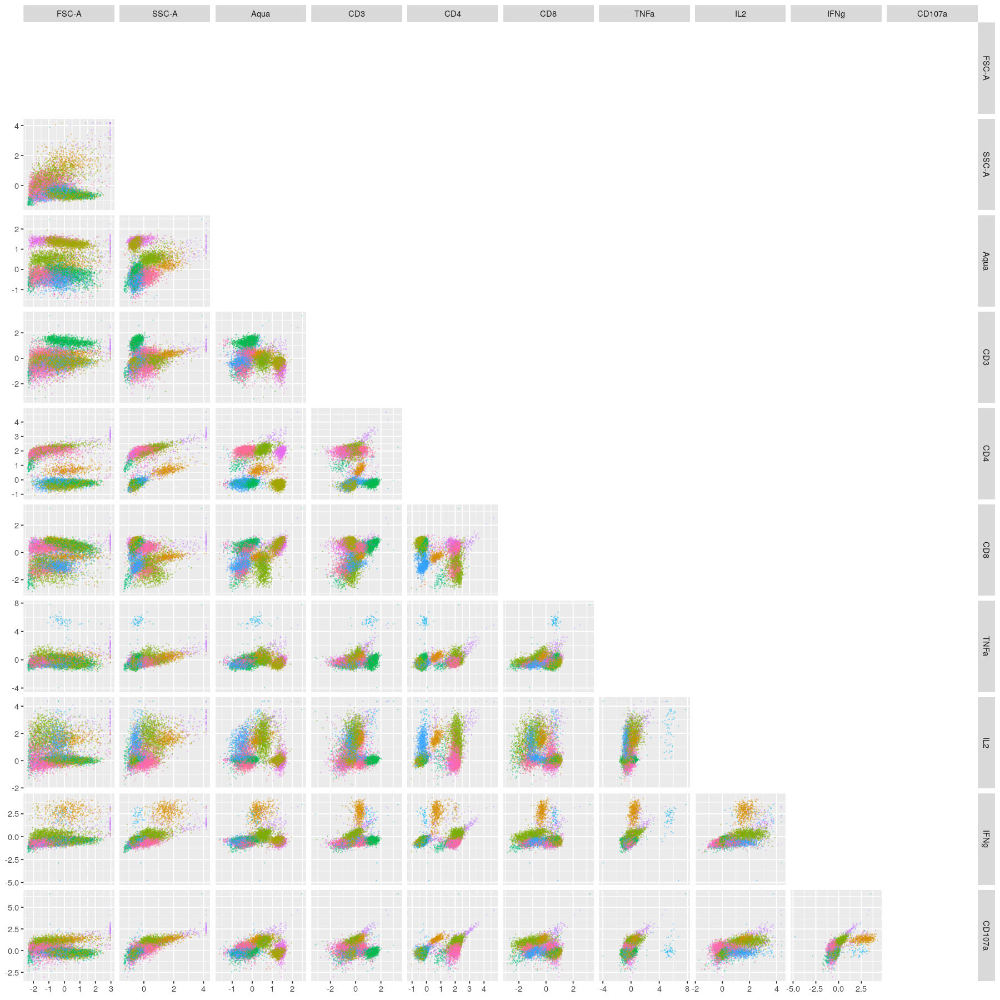

In [29]:
dat = dat_mpsk_raw
dat = dat %>% dplyr::filter(sample == "01")
dat$cluster = as.character(dat$cluster)

gp = ggpairs(
    data    = dat,
    columns = 3:12, 
    mapping = ggplot2::aes(colour = cluster),
    
    upper = list(continuous = "blank"),
    diag  = list(continuous  = "blankDiag"),
    lower = list(
        continuous = wrap("points", alpha = 0.3, size=0.1), 
        combo      = wrap("dot",    alpha = 0.4, size=0.2)))

options(repr.plot.width = 15, repr.plot.height = 15)
print(gp)

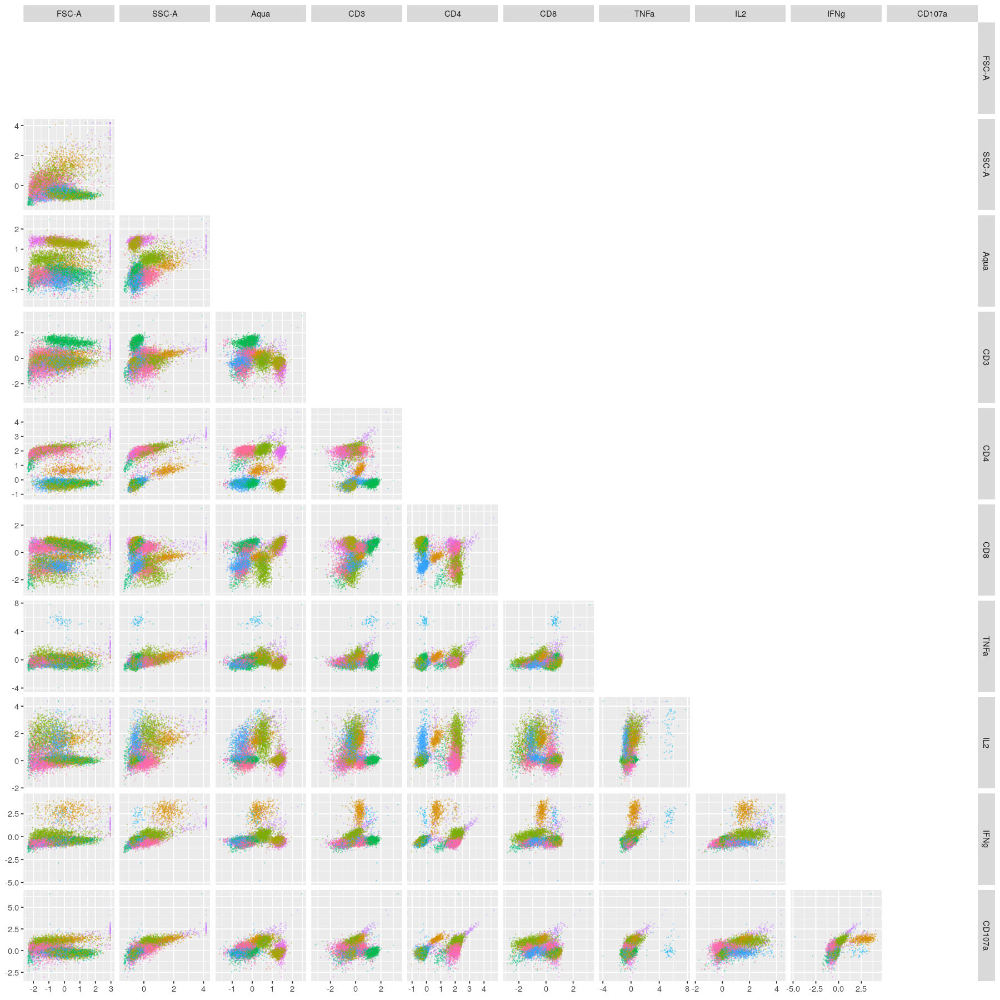

In [49]:
dat = dat_mpsk_cal
dat = dat %>% dplyr::filter(sample == "01")
dat$cluster = as.character(dat$cluster)

gp = ggpairs(
    data    = dat,
    columns = 3:12, 
    mapping = ggplot2::aes(colour = cluster),
    
    upper = list(continuous = "blank"),
    diag  = list(continuous  = "blankDiag"),
    lower = list(
        continuous = wrap("points", alpha = 0.3, size=0.1), 
        combo      = wrap("dot",    alpha = 0.4, size=0.2)))

options(repr.plot.width = 15, repr.plot.height = 15)
print(gp)

In [51]:
dat = dat_gaussnorm
head(dat)

sample,FSC-A,SSC-A,Aqua,CD3,CD4,CD8,TNFa,IL2,IFNg,CD107a
01,-0.6347897,-0.05725495,-0.5841997,0.9057631,0.8624611,0.82544730,-0.0646321,-0.5417764,0.002922948,0.843809002
01,-0.3337427,-0.69596941,1.0780301,-0.6396301,-0.9608552,0.83648958,-0.4827010,-0.5454269,-0.102532512,-0.012404418
01,1.0175645,-0.80348247,-1.2228949,-0.5834939,-0.9826067,-1.53960754,-1.0548905,-0.5562218,-0.200782508,-0.000150287
01,-1.0613336,-0.53735841,-0.7219453,0.1307065,0.4782163,0.09460223,-0.4304146,-0.4997147,-0.301005899,0.014428597
01,-1.0302762,0.36724981,-0.4166907,-0.8753860,0.6843313,-0.98263009,-0.5162241,-0.7442086,-0.662089979,0.212854595
01,0.2108729,-0.25442499,-0.3636909,-0.8340660,-0.2627146,-0.52593850,-0.1355007,1.9556850,0.482898576,0.463610339


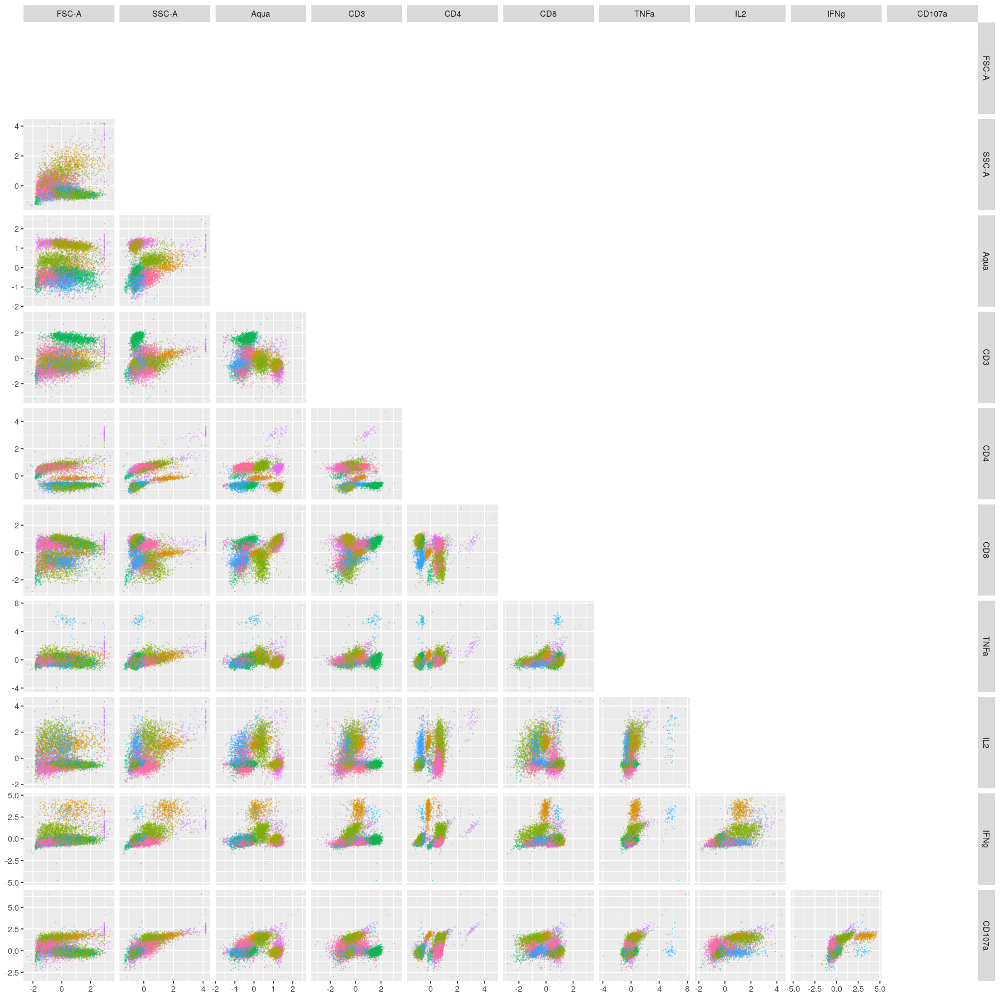

In [55]:
dat = dat_gaussnorm
dat$cluster = as.character(dat_mpsk_raw$cluster)
dat = dat %>% dplyr::filter(sample == "01")

gp = ggpairs(
    data    = dat,
    columns = 2:11, 
    mapping = ggplot2::aes(colour = cluster),
    
    upper = list(continuous = "blank"),
    diag  = list(continuous = "blankDiag"),
    lower = list(
        continuous = wrap("points", alpha = 0.3, size=0.1), 
        combo      = wrap("dot",    alpha = 0.4, size=0.2)))

options(repr.plot.width = 15, repr.plot.height = 15)
print(gp)

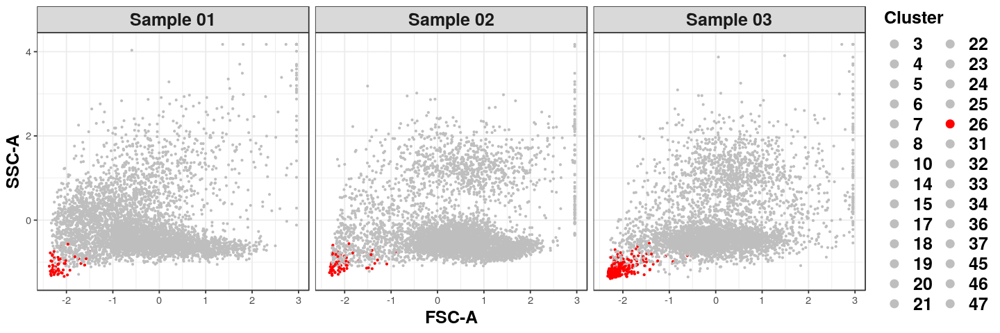

In [99]:
###
set.seed(123)
dat = dat_mpsk_raw %>% 
    dplyr::filter(sample %in% c("01", "02", "03")) %>%
    group_by(sample) %>%
    sample_n(size = 5000)
dat$sample  = paste("Sample", dat$sample)

clusters = dat$cluster %>% unique %>% sort
dat$cluster = factor(dat$cluster, levels = clusters)

###
idx  = 26
cols = c("red", rep("grey", 27))
names(cols) = c(idx, setdiff(clusters, idx))

gp = ggplot(dat, aes(x = `FSC-A`, y = `SSC-A`, color = cluster)) +
    geom_point(size = 0.5) +
    scale_color_manual(values = cols) +
    labs(x = "FSC-A", y = "SSC-A", color = "Cluster") +
    facet_wrap(~sample) + 
    theme_bw() +
    guides(colour = guide_legend(override.aes = list(size=3))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

options(repr.plot.width = 12, repr.plot.height = 4)
print(gp)

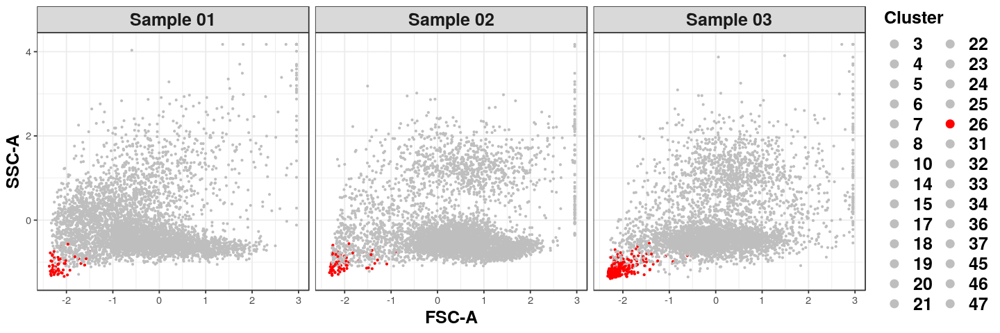

In [104]:
###
set.seed(123)
dat = dat_mpsk_cal %>% 
    dplyr::filter(sample %in% c("01", "02", "03")) %>%
    group_by(sample) %>%
    sample_n(size = 5000)
dat$sample  = paste("Sample", dat$sample)

clusters = dat$cluster %>% unique %>% sort
dat$cluster = factor(dat$cluster, levels = clusters)

###
idx  = 26
cols = c("red", rep("grey", 27))
names(cols) = c(idx, setdiff(clusters, idx))

gp = ggplot(dat, aes(x = `FSC-A`, y = `SSC-A`, color = cluster)) +
    geom_point(size = 0.5) +
    scale_color_manual(values = cols) +
    labs(x = "FSC-A", y = "SSC-A", color = "Cluster") +
    facet_wrap(~sample) + 
    theme_bw() +
    guides(colour = guide_legend(override.aes = list(size=3))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

options(repr.plot.width = 12, repr.plot.height = 4)
print(gp)

In [109]:
head(dat_gaussnorm)

sample,FSC-A,SSC-A,Aqua,CD3,CD4,CD8,TNFa,IL2,IFNg,CD107a
01,-0.6347897,-0.05725495,-0.5841997,0.9057631,0.8624611,0.82544730,-0.0646321,-0.5417764,0.002922948,0.843809002
01,-0.3337427,-0.69596941,1.0780301,-0.6396301,-0.9608552,0.83648958,-0.4827010,-0.5454269,-0.102532512,-0.012404418
01,1.0175645,-0.80348247,-1.2228949,-0.5834939,-0.9826067,-1.53960754,-1.0548905,-0.5562218,-0.200782508,-0.000150287
01,-1.0613336,-0.53735841,-0.7219453,0.1307065,0.4782163,0.09460223,-0.4304146,-0.4997147,-0.301005899,0.014428597
01,-1.0302762,0.36724981,-0.4166907,-0.8753860,0.6843313,-0.98263009,-0.5162241,-0.7442086,-0.662089979,0.212854595
01,0.2108729,-0.25442499,-0.3636909,-0.8340660,-0.2627146,-0.52593850,-0.1355007,1.9556850,0.482898576,0.463610339


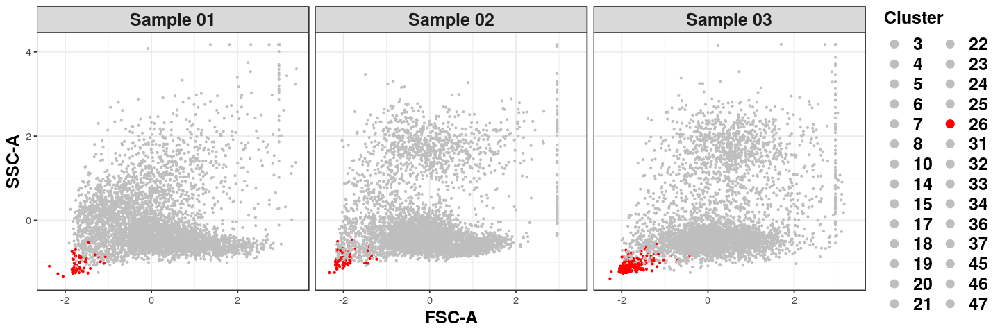

In [110]:
###
set.seed(123)
dat = dat_gaussnorm
dat$cluster  = dat_mpsk_raw$cluster

dat = dat %>%
    dplyr::filter(sample %in% c("01", "02", "03")) %>%
    group_by(sample) %>%
    sample_n(size = 5000)
dat$sample  = paste("Sample", dat$sample)

clusters = dat$cluster %>% unique %>% sort
dat$cluster = factor(dat$cluster, levels = clusters)

###
idx  = 26
cols = c("red", rep("grey", 27))
names(cols) = c(idx, setdiff(clusters, idx))

gp = ggplot(dat, aes(x = `FSC-A`, y = `SSC-A`, color = cluster)) +
    geom_point(size = 0.5) +
    scale_color_manual(values = cols) +
    labs(x = "FSC-A", y = "SSC-A", color = "Cluster") +
    facet_wrap(~sample) + 
    theme_bw() +
    guides(colour = guide_legend(override.aes = list(size=3))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

options(repr.plot.width = 12, repr.plot.height = 4)
print(gp)

# t-SNE plot

visualize several samples

In [56]:
gp_theme = theme(
    legend.title = element_text(size = 15, face = "bold"),
    legend.text  = element_text(size = 15, face = "bold"),
    strip.text   = element_text(size = 15, face = "bold"),
    axis.title   = element_text(size = 15, face = "bold"))
#######################################################################
dat = tsne_mpsk_raw
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

idx = c("01", "02", "03", "04", "05", "06")
idx = paste("Sample", idx)
dat = dat %>% dplyr::filter(sample %in% idx)

gp1 = dat %>% ggplot(., aes(x = X1, y = X2)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "Scaled Raw Data") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    gp_theme
#######################################################################
dat = tsne_mpsk_cal
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

idx = c("01", "02", "03", "04", "05", "06")
idx = paste("Sample", idx)
dat = dat %>% dplyr::filter(sample %in% idx)

gp2 = dat %>% ggplot(., aes(x = X1, y = X2)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "After MPSK Calibration") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    gp_theme
#######################################################################
dat = tsne_gaussnorm
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

idx = c("01", "02", "03", "04", "05", "06")
idx = paste("Sample", idx)
dat = dat %>% dplyr::filter(sample %in% idx)

gp3 = dat %>% ggplot(., aes(x = X1, y = X2)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "Gaussnorm") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    gp_theme

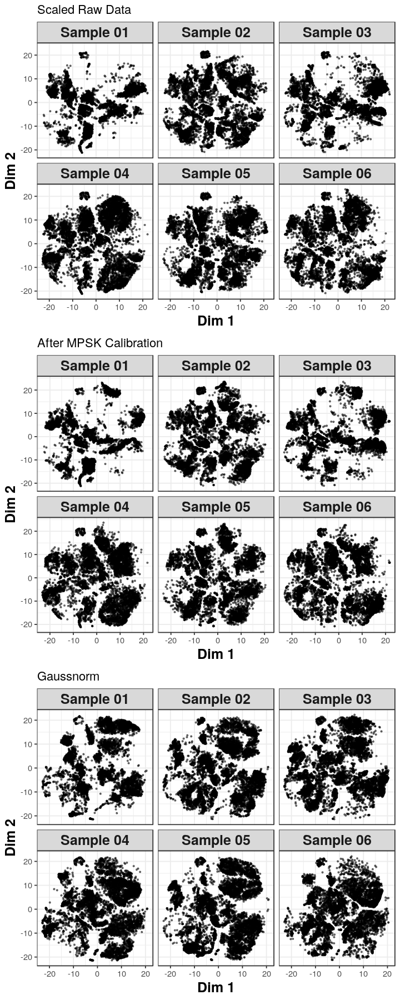

In [57]:
#######################################################################
options(repr.plot.width = 6, repr.plot.height = 15)
grid.arrange(gp1, gp2, gp3, ncol = 1)

### color the cluster

tsne plot for raw (scaled) data

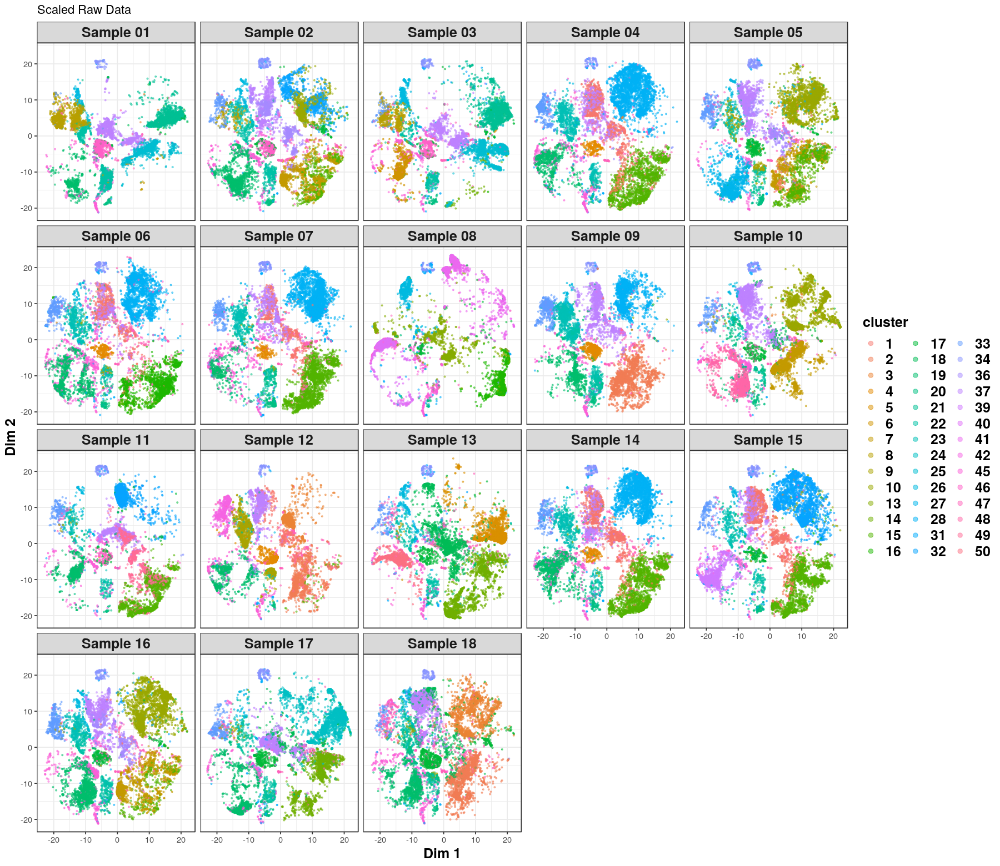

In [45]:
dat = tsne_mpsk_raw
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

options(repr.plot.width = 15, repr.plot.height = 13)
gp = dat %>% ggplot(., aes(x = X1, y = X2, color = cluster)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "Scaled Raw Data") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

print(gp)

tsne for data after MPSK calibration

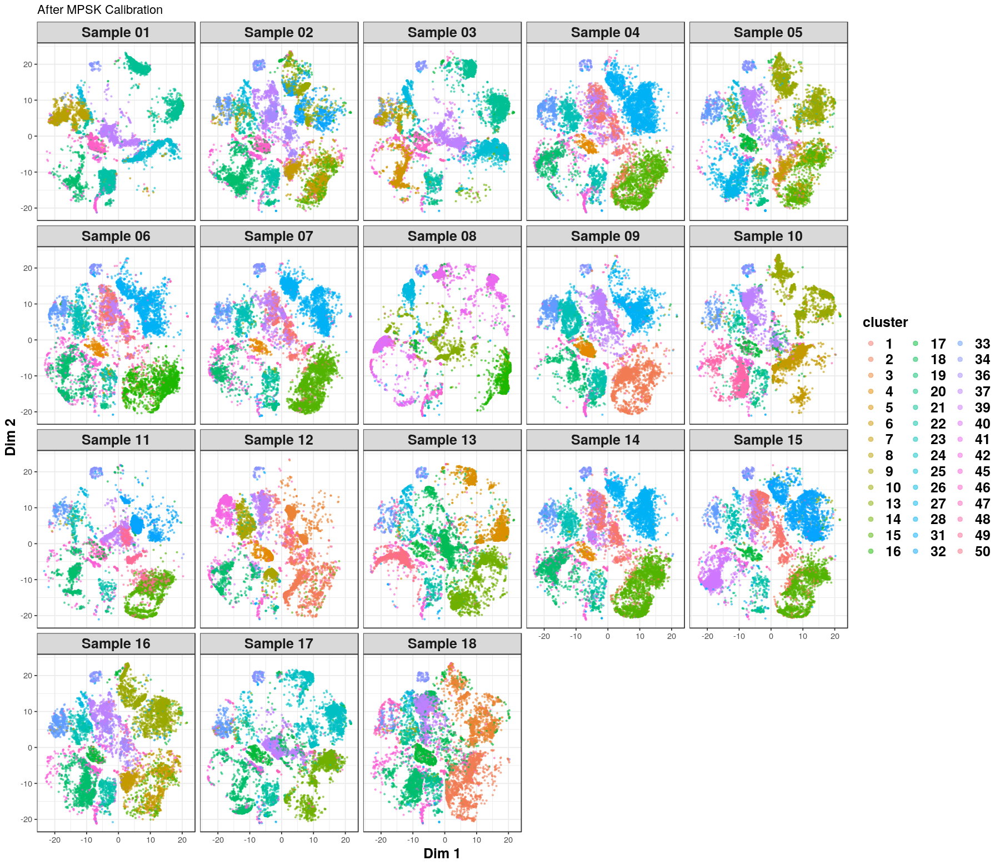

In [47]:
dat = tsne_mpsk_cal
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

options(repr.plot.width = 15, repr.plot.height = 13)
gp = dat %>% ggplot(., aes(x = X1, y = X2, color = cluster)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "After MPSK Calibration") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

print(gp)

tsne of gaussnorm batch removal

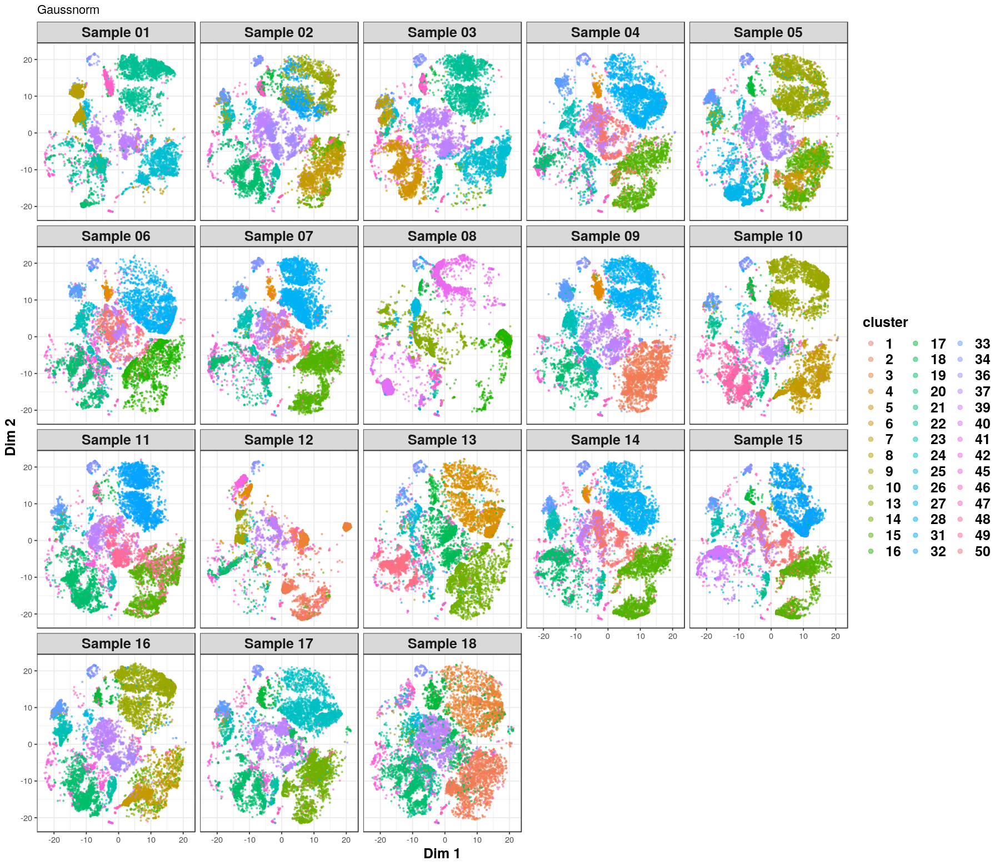

In [48]:
dat = tsne_gaussnorm
dat$sample  = paste("Sample", dat_mpsk_raw$sample)
dat$cluster = factor(dat_mpsk_raw$cluster)

options(repr.plot.width = 15, repr.plot.height = 13)
gp = dat %>% ggplot(., aes(x = X1, y = X2, color = cluster)) + 
    geom_point(size = 0.5, alpha = 0.5) + 
    facet_wrap(~sample) + 
    theme_bw() +
    labs(x = "Dim 1", y = "Dim 2", title = "Gaussnorm") +
    guides(colour = guide_legend(override.aes = list(size=2))) +
    theme(legend.title = element_text(size = 15, face = "bold"),
          legend.text  = element_text(size = 15, face = "bold"),
          strip.text   = element_text(size = 15, face = "bold"),
          axis.title   = element_text(size = 15, face = "bold"))

print(gp)